# Exercise 3 | TKO_7092 Evaluation of Machine Learning Methods 2024
## deadline: 14.2.2024 - 23:59

Regarding any questions about this exercise, please contact course assistant Jonne Pohjankukka (jjepoh@utu.fi)

********************************************

Student name: Lauri Maila

Student number: 2209361

Student email: lkmail@utu.fi

********************************************

## Water permeability prediction in forestry <br>

In this task, the client wants you to estimate the spatial prediction performance of K-nearest neighbor regression model with K=15 (15NN), using spatial leave-one-out cross-validation (i.e. SKCV, with number of folds == number of data points). The client wants you to use the C-index as the performance measure.  

In other words, the client wants you to answer the question: "What happens to the prediction performance of water permeability using 15-nearest neighbor regression model, when the geographical distance between known data and unknown data increases?".

In this task, you have three data files available (with 1691 data points): 

- input.csv, contains the 75 predictor features. 
- output.csv, contains the water permebility values. 
- coordinates.csv, contains the corresponding geographical coordinate locations of the data points. The unit of the coordinates is metre, and you can use Euclidean distance to calculate distances between the coordinate points. 

Implement the following tasks to complete this exercise:

********************************************

#### 1. Z-score standardize the predictor features (input.csv). 

#### 2. Perform spatial leave-one-out cross-validation with 15NN model for the provided data set (refer to the lectures 3.1.3 and 3.1.4 for help). Estimate the water permeability prediction performance (using 15NN model and C-index) with the following distance parameter values: d = 0, 10, 20, ..., 250 (that is, 10 meter intervals from 0m to 250m). 

#### 3. When you have calculated the C-index performance measure for each value of d, visualize the results with the C-index (y-axis) as a function of d (x-axis).

********************************************

Your .ipynb-file must include the following: 

- Your own implementation of the spatial leave-one-out cross-validation for the current task. You can use third-party libraries (e.g. Scikit-learn) if you want for implementing e.g. the 15-nearest neighbor. Also, try to follow good programming practices and add comments to relevant parts of your code explaining what you are doing and why.


- Plot of the graph C-index vs. distance parameter value. 


<br><br><br>
-- START IMPLEMENTING YOUR EXERCISE AFTER THIS LINE --
<br><br><br>

### Import necessary libraries

In [90]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsRegressor

### Read in the datasets

In [92]:
# In this cell, read the files input.csv, output.csv and coordinates.csv.
# Print out the dataset dimesions (i.e. number of rows and columns).

df_input = pd.read_csv('input.csv', header=None)

df_output = pd.read_csv('output.csv', header=None)

coordinates = np.genfromtxt('coordinates.csv', delimiter=',')

print(f'Input - rows, columns: {df_input.shape}')
print(f'Output - rows, columns: {df_output.shape}')
print(f'Coordinates - rows, columns: {np.shape(coordinates)}')

Input - rows, columns: (1691, 75)
Output - rows, columns: (1691, 1)
Coordinates - rows, columns: (1691, 2)


### Standardization of the predictor features (input.csv)

In [93]:
# Standardize the predictor features (input.csv) by removing the mean and scaling to unit variance. 
# In other words, z-score the predictor features. You are allowed to use third-party libraries for doing this.

# Standardize using StandardScaler from sklearn
SC = StandardScaler()
df_input_std = SC.fit_transform(df_input)

# Convert back to dataframe
df_input_std = pd.DataFrame(df_input_std, columns=df_input.columns)

# Print the first few rows to check the df
df_input_std.head()

,0,1,2,3,4,5,6,7,8,9,...,65,66,67,68,69,70,71,72,73,74
0,-0.053196,-0.219296,0.210020,0.704425,0.339477,0.412638,0.331074,-0.034411,-0.184481,0.307345,...,0.219541,0.539119,-0.645254,-0.519918,-0.447089,0.554097,0.087285,-0.109193,-0.913639,-0.461479
1,-0.632098,-0.682804,-0.285522,-0.369542,-0.138305,2.489725,2.051755,-0.034411,-0.246906,-0.226797,...,0.219541,-0.169259,-0.645254,2.475438,-0.447089,-0.288927,-0.035919,-1.481978,-1.087664,-0.461479
2,-0.674980,-0.597421,-0.568689,-0.983237,-0.828435,-0.496087,-0.451053,-0.034411,-0.324938,-0.627405,...,-1.047724,-0.877636,-0.645254,-0.519918,-0.447089,-0.375320,-0.159124,0.349947,0.134707,-0.809315
3,-0.331927,-0.154649,1.307292,0.090730,0.419107,1.061728,0.956776,-0.034411,-0.301529,-0.360333,...,-1.047724,-0.877636,-0.645254,-0.519918,-0.447089,-0.383278,0.703308,0.467238,0.107450,-0.832933
4,-0.610657,-0.673046,-0.161636,-0.522966,-0.377196,0.672274,0.800351,-0.034411,-0.363954,-0.961244,...,-1.047724,-0.877636,2.098494,0.977760,1.960643,-0.296657,0.087285,-0.333328,-0.636876,-0.542584


### Functions and analysis code

In [94]:
# Include here all the functions and other relevant code that you need in order to implement the task.

# Note! Utilize the following two functions in your implementation:

### Function for calculating C-index ###
# y: array containing true label values.
# yp: array containing the predicted label values.
def cindex(y, yp):
    n = 0
    h_num = 0 
    for i in range(0, len(y)):
        t = y[i]
        p = yp[i]
        for j in range(i+1, len(y)):
            nt = y[j]
            np = yp[j]
            if (t != nt): 
                n = n + 1
                if (p < np and t < nt) or (p > np and t > nt): 
                    h_num += 1
                elif (p == np):
                    h_num += 0.5
    return h_num/n


### Function for calculating the pairwise spatial distances between the data points ###
# The function will return a n-by-n matrix of Euclidean distances. For example, the
# distance_matrix element at indices i,j will contain the spatial distance between 
# data point i and j. Note that the element value is 0 always when i==j.
# coordinate_array: n-by-2 array containing the coordinates of the exercise data points.
def cdists(coordinate_array):
    number_of_observations = coordinate_array.shape[0]
    distance_matrix = np.zeros((number_of_observations, number_of_observations))
    for i in range(0, number_of_observations):
        distance_matrix[i, :] = np.sqrt(np.sum((coordinate_array - coordinate_array[i])**2, axis=1))
    return distance_matrix


### Function for spatial leave-one-out cross-validation (LOOCV) ###
def spatial_loocv(k, distance_param, coordinates, df_input, df_output):

    # Number of input rows
    n = df_input.shape[0]

    # Calculate distance matrix from coordinates
    dist_matrix = cdists(coordinates)
    
    # Store actual values and predictions for C-index calculation
    true_values = []
    predictions = []

    # Loop over all data points (leave-one-out cross-validation)
    for i in range(n):
        X = df_input
        y = df_output

        # Use the i-th data point as test set
        X_test = df_input.iloc[[i]]
        y_test = df_output.iloc[[i]]
        
        # Find indices where the distance to current test point is <= to the distance parameter
        nearby_indices = np.where((dist_matrix[i] <= distance_param))[0]

        # Remove the nearby points from the training set
        X_train = X.drop(index=nearby_indices, inplace=False)
        y_train = y.drop(index=nearby_indices, inplace=False)
        
        # Fit the kNN model
        knn = KNeighborsRegressor(n_neighbors=k)
        knn.fit(X_train, y_train)
        
        # Predict model on the left out data point
        y_pred = knn.predict(X_test)

        # Store the predictions and true values
        predictions.append(y_pred)
        true_values.append(y_test.values.flatten())

    # At the end, calculate the C-index using provided function
    c_index = cindex(true_values, predictions)
    return c_index

### Results for spatial leave-one-out cross-validation with 15-nearest neighbor regression model

In [88]:


# Distance parameters from 0 to 250 in steps of 10
distance_params = list(range(0, 251, 10))
k = 15 # Using k=15 for kNN

# Store c_index result for each distance parameter
results = []

for d in distance_params:
    # Calculate C-index for each distance parameter
    c_index = spatial_loocv(k, d, coordinates, df_input, df_output)
    results.append({"dist": d, "cind": c_index})


[0]
[1]
[2 3]
[2 3]
[4]
[5]
[6]
[7]
[8]
[ 9 10]
[ 9 10]
[11]
[12]
[13]
[14]
[15]
[16]
[17]
[18]
[19]
[20]
[21]
[22]
[23]
[24]
[25]
[26]
[27]
[28 30 32]
[29]
[28 30 32]
[31]
[28 30 32]
[33 34 35]
[33 34 35]
[33 34 35]
[36 37 38 39 41 42]
[36 37 38 39 41 42]
[36 37 38 39 41 42]
[36 37 38 39 41 42]
[40]
[36 37 38 39 41 42]
[36 37 38 39 41 42]
[43 44 45 46 47 48 50 51 52]
[43 44 45 46 47 48 50 51 52]
[43 44 45 46 47 48 50 51 52]
[43 44 45 46 47 48 50 51 52]
[43 44 45 46 47 48 50 51 52]
[43 44 45 46 47 48 50 51 52]
[49]
[43 44 45 46 47 48 50 51 52]
[43 44 45 46 47 48 50 51 52]
[43 44 45 46 47 48 50 51 52]
[53 61]
[54 55 57 58 59 60 62 63]
[54 55 57 58 59 60 62 63]
[56]
[54 55 57 58 59 60 62 63]
[54 55 57 58 59 60 62 63]
[54 55 57 58 59 60 62 63]
[54 55 57 58 59 60 62 63]
[53 61]
[54 55 57 58 59 60 62 63]
[54 55 57 58 59 60 62 63]
[64 65 66 67 68 71 72 73 74]
[64 65 66 67 68 71 72 73 74]
[64 65 66 67 68 71 72 73 74]
[64 65 66 67 68 71 72 73 74]
[64 65 66 67 68 71 72 73 74]
[69 70]
[69 70]
[6

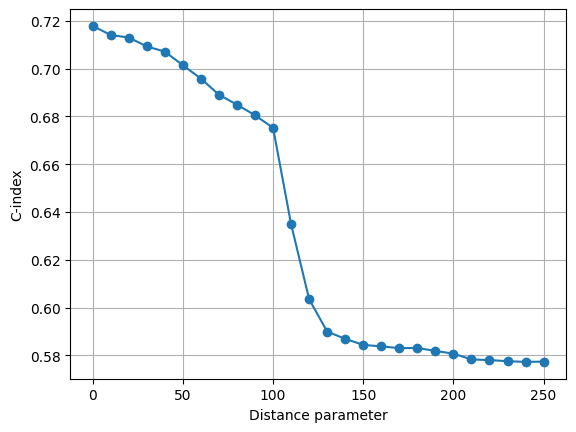

In [99]:
res_distances = [result["dist"] for result in results]
res_c_indices = [result["cind"] for result in results]

# Plot the results
plt.plot(res_distances, res_c_indices, marker='o')
plt.xlabel('Distance parameter')
plt.ylabel('C-index')
plt.grid(True)
plt.show()

### Interpretation of the results

In [ ]:
# In this cell, give a brief commentary on the results, what happens to the prediction 
# performance as the prediction distance increases?

# As prediction distance increases, prediction performance decreases. This is caused by spatial autocorrelation when data points near the test point are used for training the model.
# When nearby data points are ignored with larger distance, less information "leaks" from the nearby points to the model, which results in more realistic performance evaluation.